# <a id='toc1_'></a>[Lung Cancer Detection using Deep Learning](#toc0_)

**Table of contents**<a id='toc0_'></a>    
- [Lung Cancer Detection using Deep Learning](#toc1_)    
    - [Problem Statement](#toc1_1_1_)    
    - [Goals](#toc1_1_2_)    
    - [Objectives](#toc1_1_3_)    
    - [Importance of the Project](#toc1_1_4_)    
  - [Preprocessing](#toc1_2_)    
  - [Visualisation](#toc1_3_)    
  - [U-Net model Building and Saving](#toc1_4_)    
  - [Making prediction with loaded model](#toc1_5_)    
    - [Key Observations:](#toc1_5_1_)    
  - [Model Evaluation](#toc1_6_)    
  - [Conclusion](#toc1_7_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

The dataset is taken from kaggle "https://www.kaggle.com/datasets/paritosh921/adenocarcinoma-lungs-cancer-image-and-mask"
### <a id='toc1_1_1_'></a>[Problem Statement](#toc0_)
Lung cancer is one of the leading causes of cancer-related deaths worldwide, primarily due to late detection. Early and accurate detection significantly improves treatment outcomes. However, traditional diagnostic methods, such as CT scans and X-rays, require expert radiologists and can be time-consuming. Manual diagnosis is also prone to human error, leading to misdiagnosis or delays in treatment. This project aims to automate lung cancer detection using a deep learning-based UNet model embedded in a web application, allowing users to upload medical images and receive instant visualizations of detected cancerous regions.
Goals and Objectives
### <a id='toc1_1_2_'></a>[Goals](#toc0_)
- To develop a deep learning-based lung cancer detection system that can accurately identify cancerous regions in lung images.
- To create a user-friendly web application where users can upload medical images and get real-time predictions.
### <a id='toc1_1_3_'></a>[Objectives](#toc0_)
- Train a UNet model for lung cancer segmentation to highlight affected regions.
- Implement a web-based interface where users can upload images for analysis.
- Provide visual feedback by overlaying the predicted cancer regions on the uploaded image.
- Ensure high accuracy and reliability by validating the model’s performance against real-world data.
### <a id='toc1_1_4_'></a>[Importance of the Project](#toc0_)
- Early Detection Saves Lives – Faster and more accurate detection of lung cancer can significantly improve survival rates.
- Reduces Dependency on Experts – Assists radiologists by providing an automated second opinion, reducing workload and minimizing human error.
- Accessibility and Convenience – A web-based system allows easy access to lung cancer detection without requiring specialized medical software.
- Scalability for Large-Scale Screening – Can be integrated into hospitals and diagnostic centers for mass screening, helping detect lung cancer at an early stage.


This project bridges the gap between AI-driven automation and medical diagnostics, making lung cancer detection faster, more accessible, and more reliable.

## <a id='toc1_2_'></a>[Preprocessing](#toc0_)

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, losses, optimizers
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split
import cv2
import matplotlib.pyplot as plt

# Paths to your dataset
xray_images_path = "/Users/akashvs/Documents/lung_cancer_data_copy/train/adenocarcinoma"
masks_path = "/Users/akashvs/Documents/lung_cancer_data_copy/train/mask"

# Parameters
IMG_HEIGHT, IMG_WIDTH = 256, 256  # Resize images for uniformity
BATCH_SIZE = 16
EPOCHS = 30
THRESHOLD = 0.5  # Threshold for mask classification

# Helper function to apply preprocessing

def preprocess_image(image_path):
    # Load and normalize the grayscale image
    img = load_img(image_path, target_size=(IMG_HEIGHT, IMG_WIDTH), color_mode="grayscale")
    img = img_to_array(img) / 255.0  # Normalize to [0, 1]
    
    # Add a channel dimension to the original image
    img = np.expand_dims(img.squeeze(), axis=-1)
    
    # Flipping
    flipped_img = np.expand_dims(np.fliplr(img.squeeze()), axis=-1)
    
    # Noise Reduction (Gaussian Blur)
    noise_reduced_img = cv2.GaussianBlur(img.squeeze(), (5, 5), 0)
    noise_reduced_img = np.expand_dims(noise_reduced_img, axis=-1)
    
    # Contrast Adjustment (Histogram Equalization)
    equalized_img = cv2.equalizeHist((img.squeeze() * 255).astype(np.uint8)) / 255.0
    equalized_img = np.expand_dims(equalized_img, axis=-1)
    
    # Feature Extraction (Sobel filter)
    sobel_x = cv2.Sobel(img.squeeze(), cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(img.squeeze(), cv2.CV_64F, 0, 1, ksize=3)
    sobel_combined = np.sqrt(sobel_x ** 2 + sobel_y ** 2)
    sobel_combined = (sobel_combined / sobel_combined.max()).astype(np.float32)
    sobel_combined = np.expand_dims(sobel_combined, axis=-1)
    
    # Stack all preprocessed versions along the channel axis
    combined = np.concatenate(
        [img, flipped_img, noise_reduced_img, equalized_img, sobel_combined], axis=-1
    )
    return combined


# Helper function to load images and masks
def load_data(image_path, mask_path):
    images, masks = [], []
    for filename in os.listdir(image_path):
        # Preprocess image
        img = preprocess_image(os.path.join(image_path, filename))
        images.append(img)

        # Load and preprocess mask
        mask = load_img(
            os.path.join(mask_path, filename),
            target_size=(IMG_HEIGHT, IMG_WIDTH),
            color_mode="grayscale",
        )
        mask = img_to_array(mask) / 255.0  # Normalize to [0, 1]
        masks.append(mask)

    return np.array(images), np.array(masks)

# Load the dataset
x_images, y_masks = load_data(xray_images_path, masks_path)

## <a id='toc1_3_'></a>[Visualisation](#toc0_)

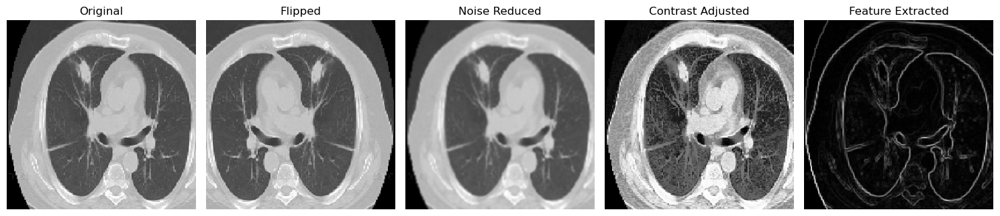

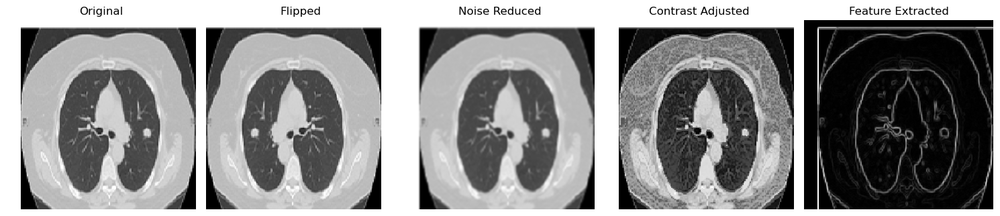

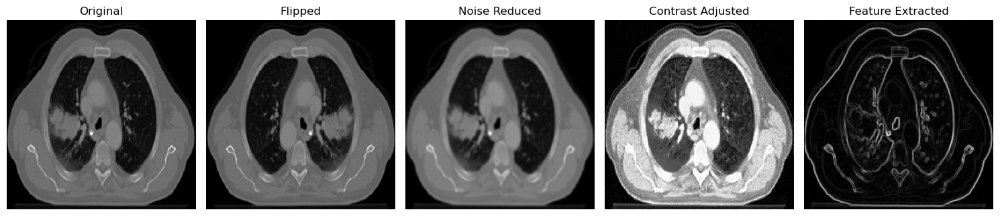

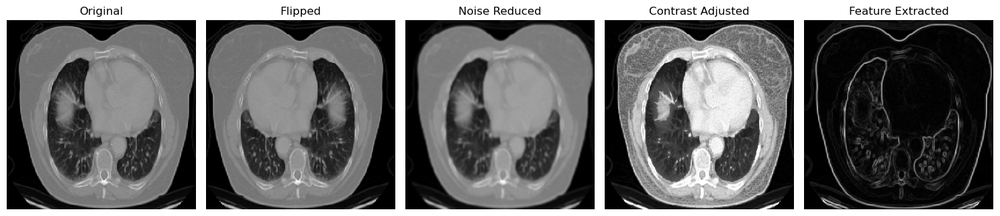

In [ ]:
import matplotlib.pyplot as plt

def visualize_preprocessing(image_path):
    # Load and preprocess the image
    img = load_img(image_path, target_size=(IMG_HEIGHT, IMG_WIDTH), color_mode="grayscale")
    img = img_to_array(img) / 255.0  # Normalize to [0, 1]
    
    flipped_img = np.fliplr(img.squeeze())
    noise_reduced_img = cv2.GaussianBlur(img.squeeze(), (5, 5), 0)
    equalized_img = cv2.equalizeHist((img.squeeze() * 255).astype(np.uint8)) / 255.0
    sobel_x = cv2.Sobel(img.squeeze(), cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(img.squeeze(), cv2.CV_64F, 0, 1, ksize=3)
    sobel_combined = np.sqrt(sobel_x ** 2 + sobel_y ** 2)
    sobel_combined = (sobel_combined / sobel_combined.max()).astype(np.float32)
    
    # Plot the results
    titles = ["Original", "Flipped", "Noise Reduced", "Contrast Adjusted", "Feature Extracted"]
    images = [img.squeeze(), flipped_img, noise_reduced_img, equalized_img, sobel_combined]
    
    plt.figure(figsize=(15, 8))
    for i in range(len(images)):
        plt.subplot(1, 5, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i])
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Call the function with an example image
for i in range(1,5):
    visualize_preprocessing(os.path.join(xray_images_path, f"/Users/akashvs/Documents/lung_cancer_data_copy/train/adenocarcinoma/{i}.png"))


## <a id='toc1_4_'></a>[U-Net model Building and Saving](#toc0_)

In [ ]:
# Split into training and validation sets
x_train, x_val, y_train, y_val = train_test_split(
    x_images, y_masks, test_size=0.2, random_state=42
)

# Define the U-Net model (updated for multi-channel input)
def build_unet(input_shape):
    inputs = layers.Input(input_shape)

    # Encoder
    c1 = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(128, (3, 3), activation="relu", padding="same")(p1)
    c2 = layers.Conv2D(128, (3, 3), activation="relu", padding="same")(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    # Bottleneck
    c3 = layers.Conv2D(256, (3, 3), activation="relu", padding="same")(p2)
    c3 = layers.Conv2D(256, (3, 3), activation="relu", padding="same")(c3)

    # Decoder
    u1 = layers.UpSampling2D((2, 2))(c3)
    u1 = layers.Conv2D(128, (3, 3), activation="relu", padding="same")(u1)
    u1 = layers.concatenate([u1, c2])
    u1 = layers.Conv2D(128, (3, 3), activation="relu", padding="same")(u1)

    u2 = layers.UpSampling2D((2, 2))(u1)
    u2 = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(u2)
    u2 = layers.concatenate([u2, c1])
    u2 = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(u2)

    outputs = layers.Conv2D(1, (1, 1), activation="sigmoid")(u2)

    model = models.Model(inputs, outputs)
    return model

# Build and compile the model
model = build_unet((IMG_HEIGHT, IMG_WIDTH, 5))  # 5 channels (original + 4 preprocessed)
model.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss=losses.BinaryCrossentropy(),
    metrics=["accuracy", tf.keras.metrics.MeanIoU(num_classes=2)],
)

# Train the model
history = model.fit(
    x_train,
    y_train,
    validation_data=(x_val, y_val),
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
)

# Save the model
model.save("segmentation_model_unet_final.keras")

# Prediction code remains unchanged; it uses the updated model with 5-channel input.


Epoch 1/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 65s 13s/step - accuracy: 0.5887 - loss: 0.5356 - mean_io_u_13: 0.4926 - val_accuracy: 0.9861 - val_loss: 0.1293 - val_mean_io_u_13: 0.4930
Epoch 2/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 68s 14s/step - accuracy: 0.9849 - loss: 0.1616 - mean_io_u_13: 0.4925 - val_accuracy: 0.9861 - val_loss: 0.1373 - val_mean_io_u_13: 0.4930
Epoch 3/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 71s 15s/step - accuracy: 0.9840 - loss: 0.1288 - mean_io_u_13: 0.4920 - val_accuracy: 0.9861 - val_loss: 0.0811 - val_mean_io_u_13: 0.4930
Epoch 4/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 72s 15s/step - accuracy: 0.9837 - loss: 0.0867 - mean_io_u_13: 0.4919 - val_accuracy: 0.9861 - val_loss: 0.0774 - val_mean_io_u_13: 0.4930
Epoch 5/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 73s 15s/step - accuracy: 0.9844 - loss: 0.0778 - mean_io_u_13: 0.4922 - val_accuracy: 0.9861 - val_loss: 0.0706 - val_mean_io_u_13: 0.4930
Epoch 6/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 75s 15s/step - accuracy: 0.9846 - loss: 0.0717 - mean_io_u_13: 0.4923 - val_accuracy: 0.9

## <a id='toc1_5_'></a>[Making prediction with loaded model](#toc0_)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


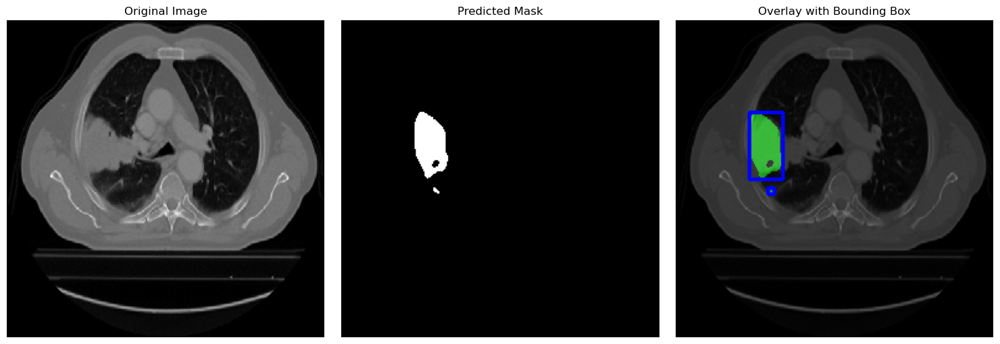

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


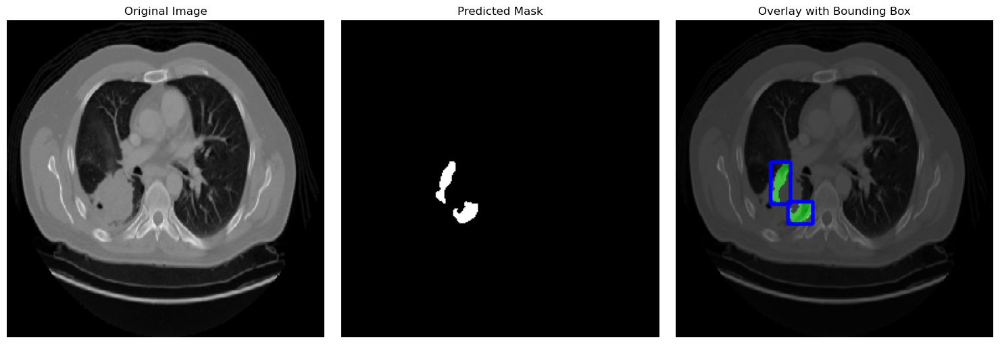

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


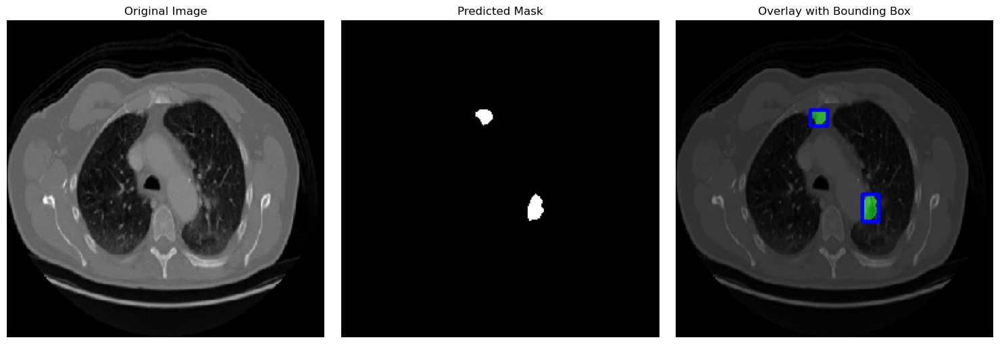

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


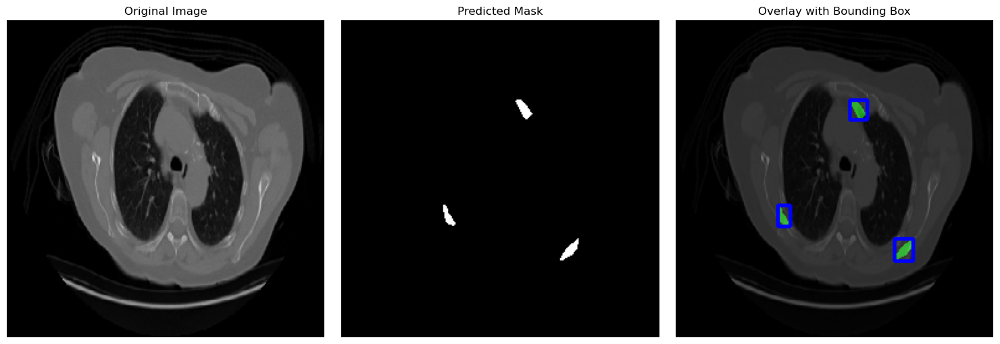

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


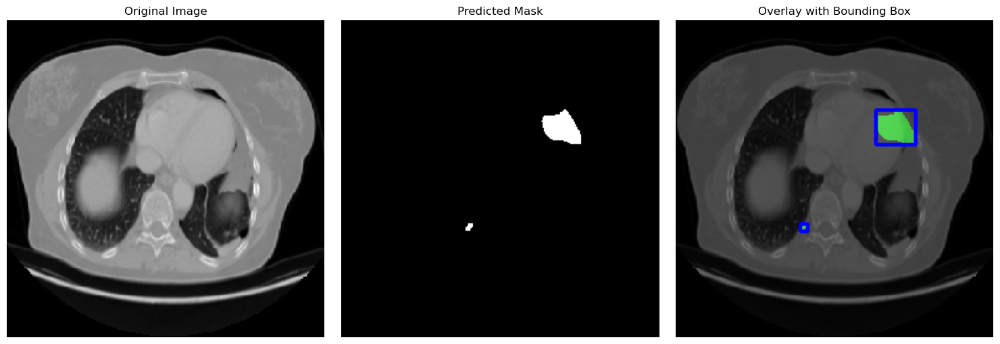

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


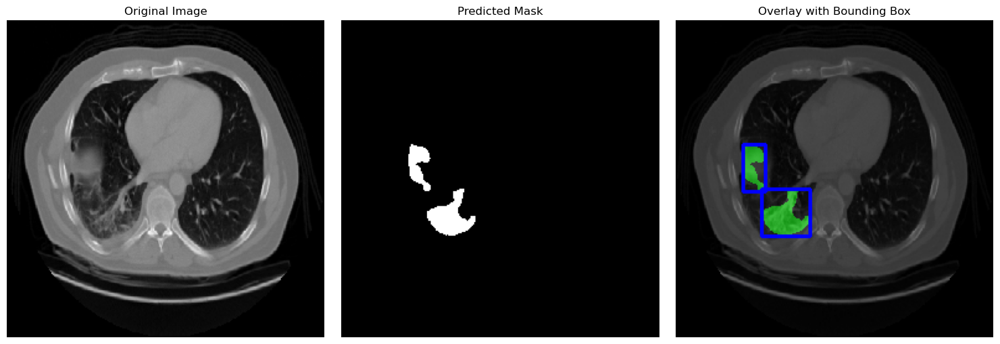

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


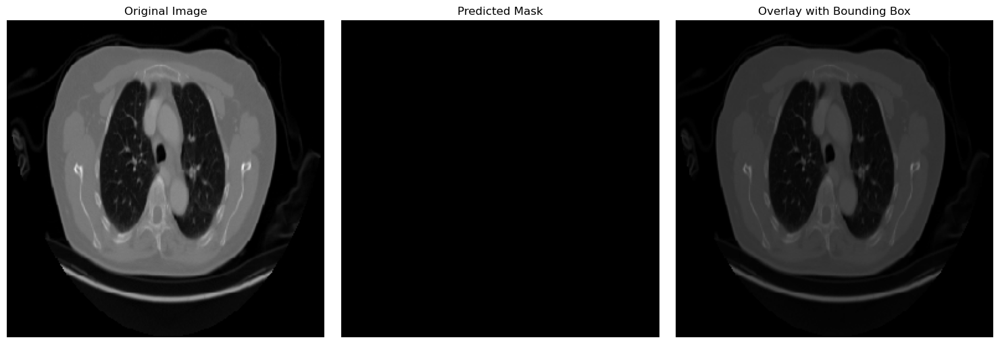

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


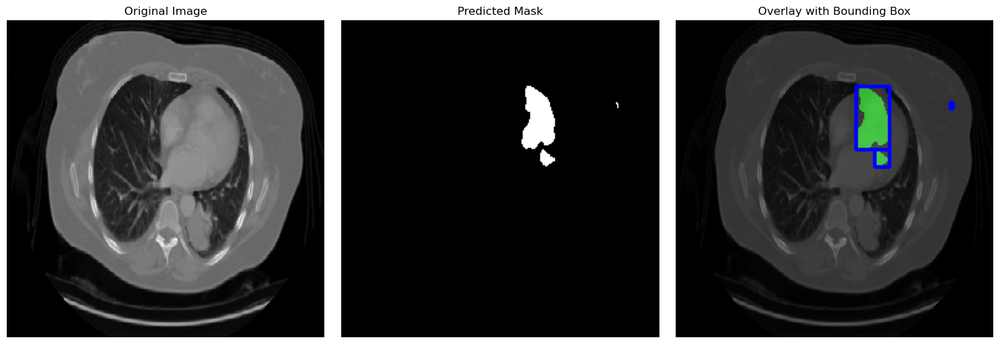

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


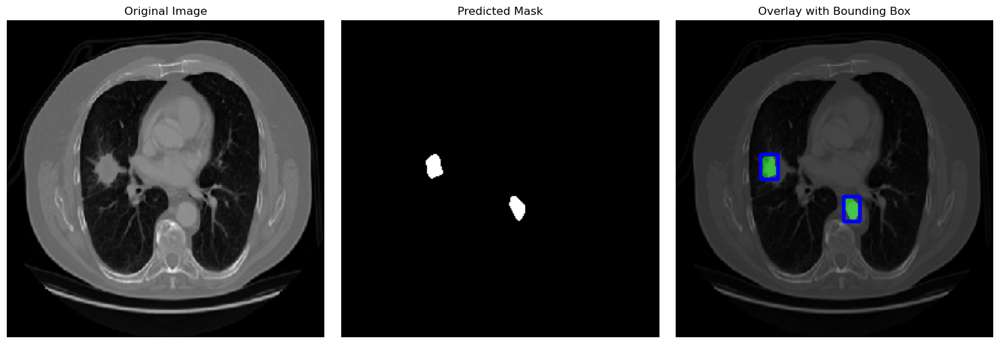

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


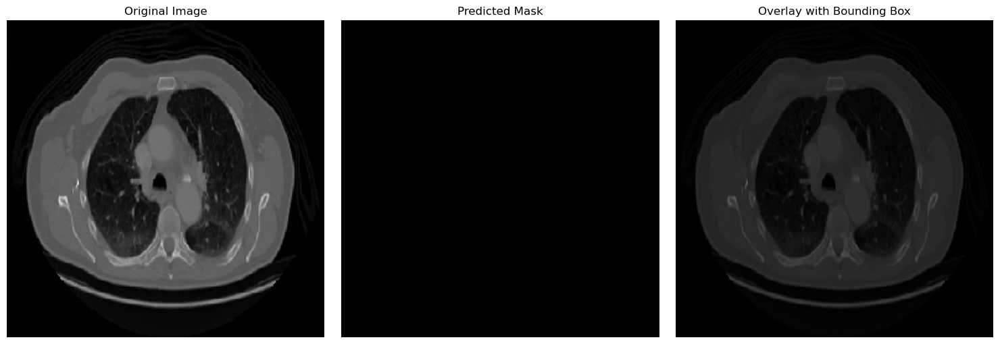

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


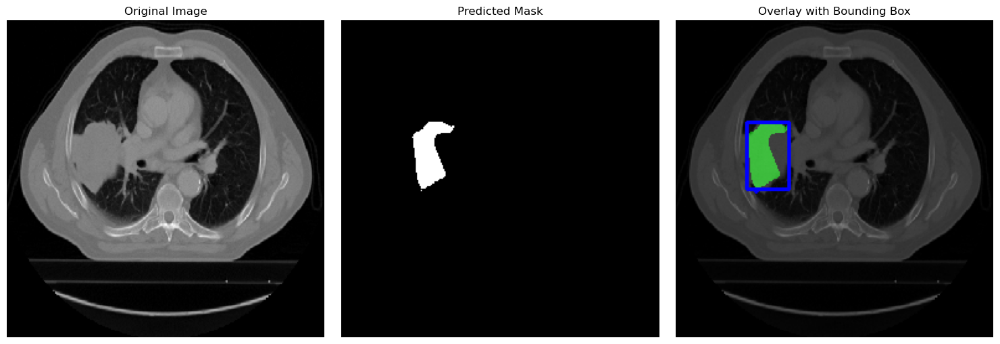

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


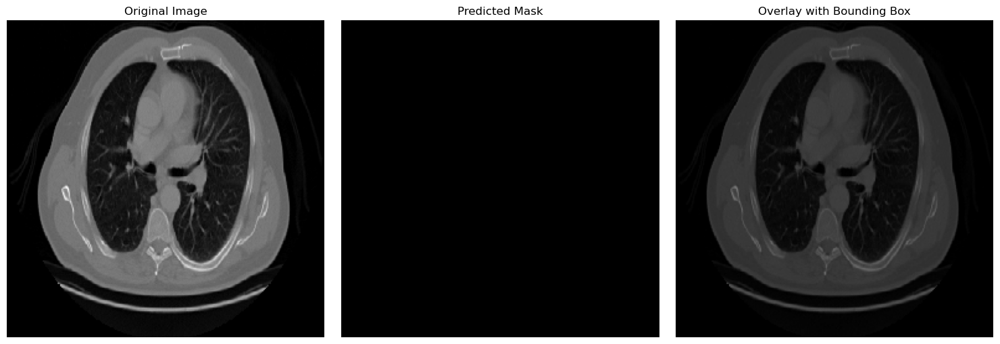

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


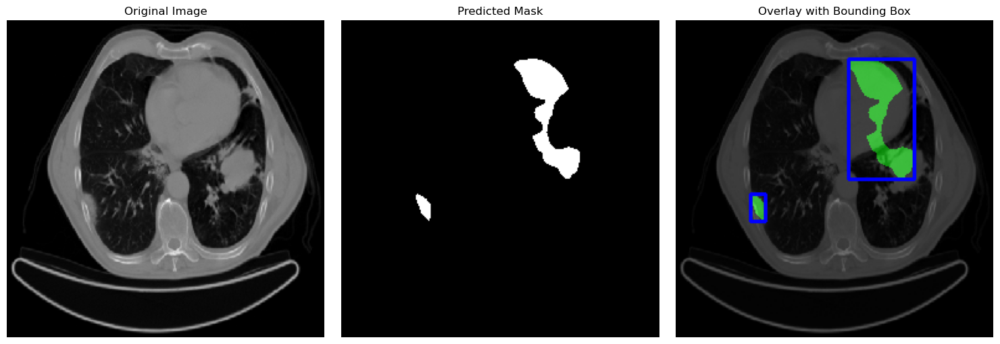

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


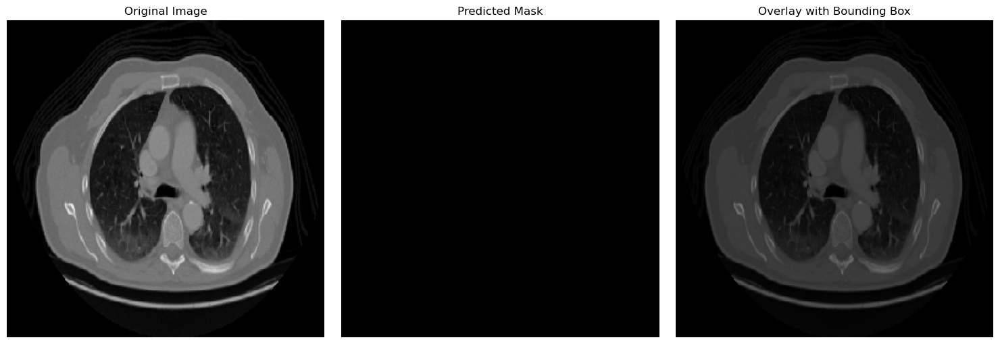

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


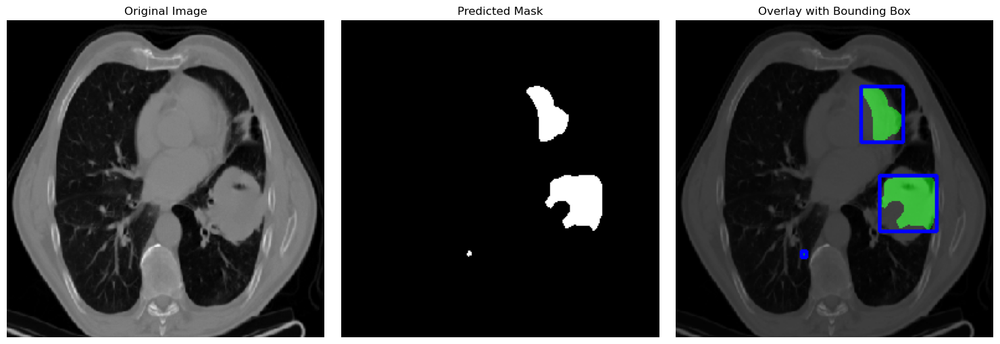

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


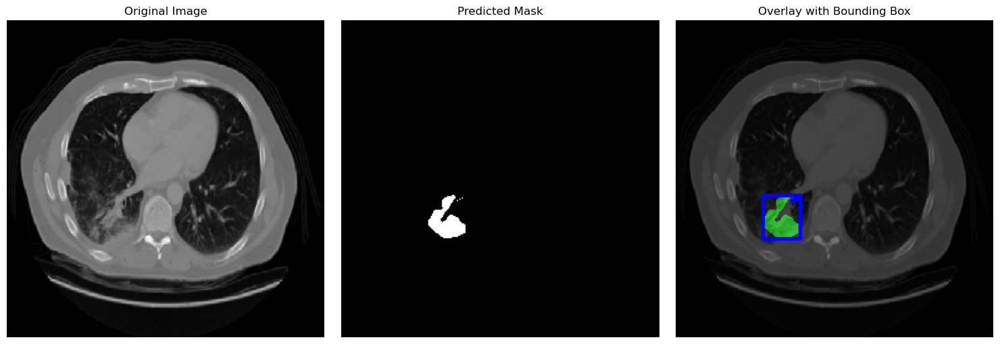

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


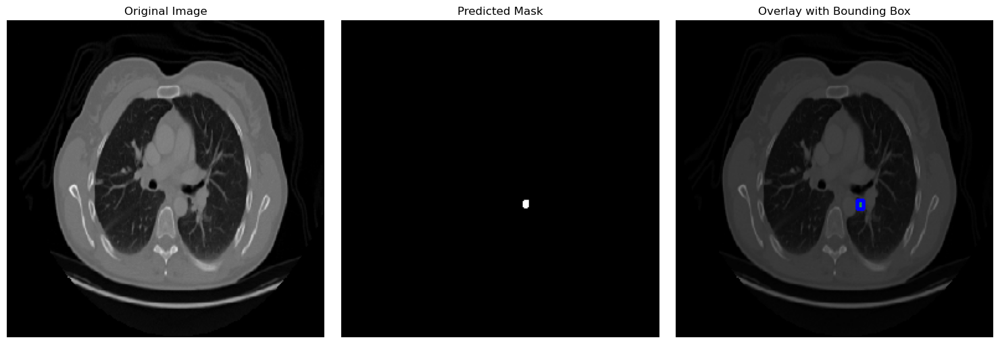

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


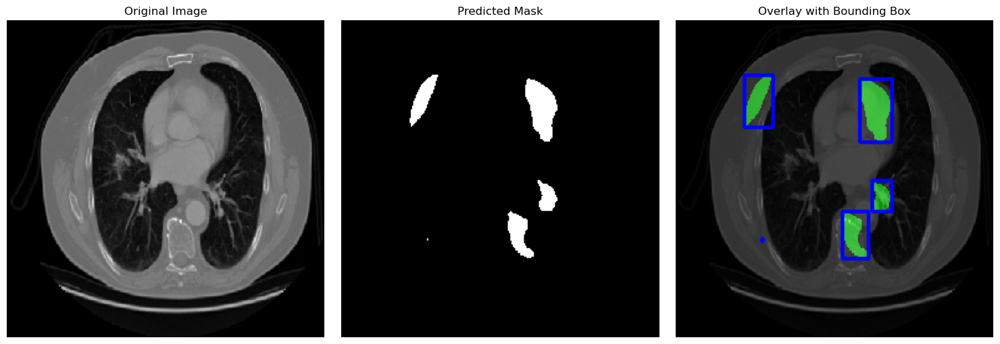

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


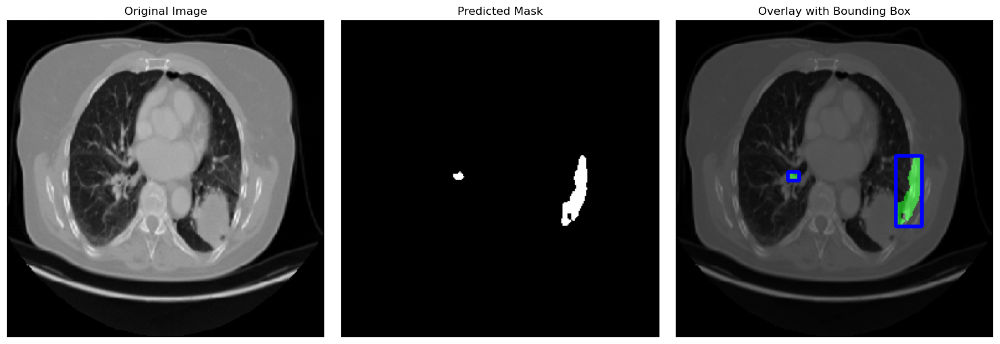

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


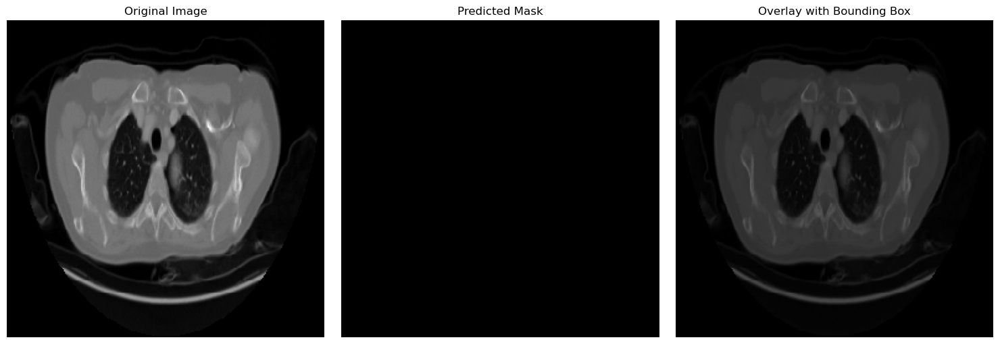

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


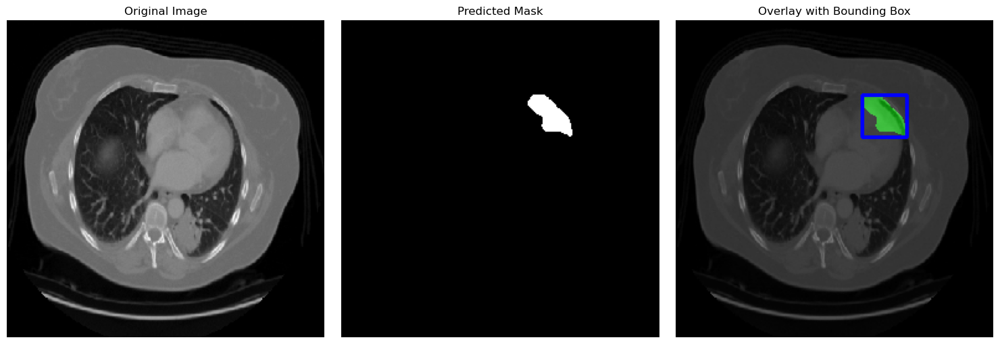

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


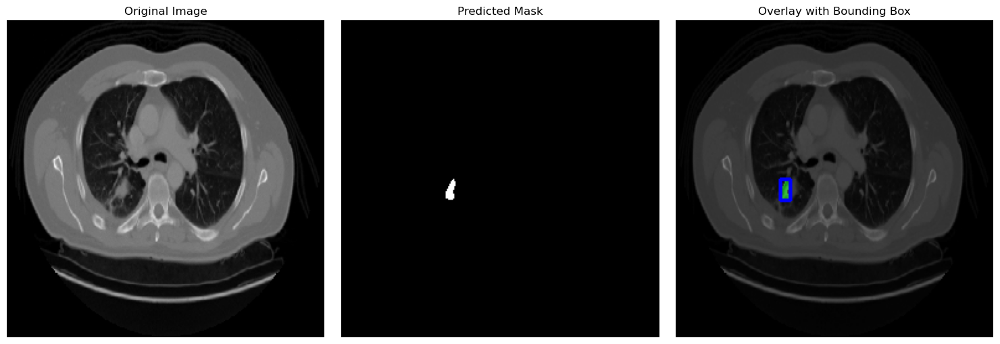

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


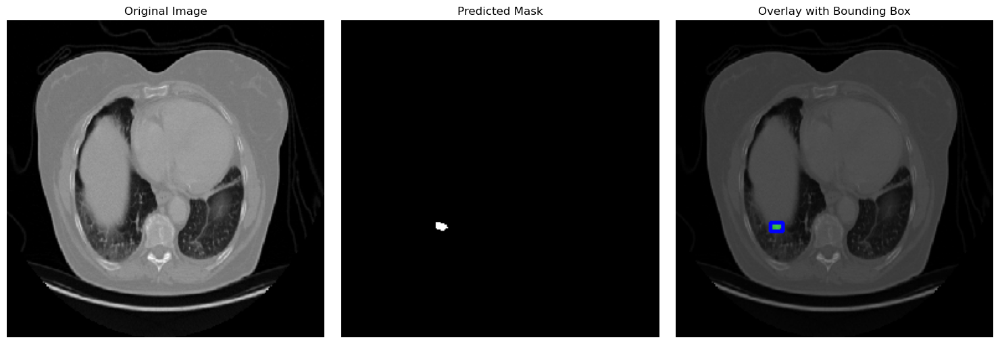

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


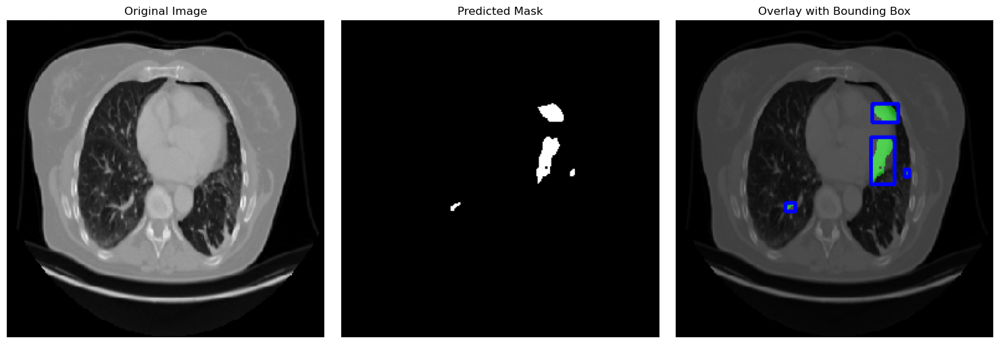

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


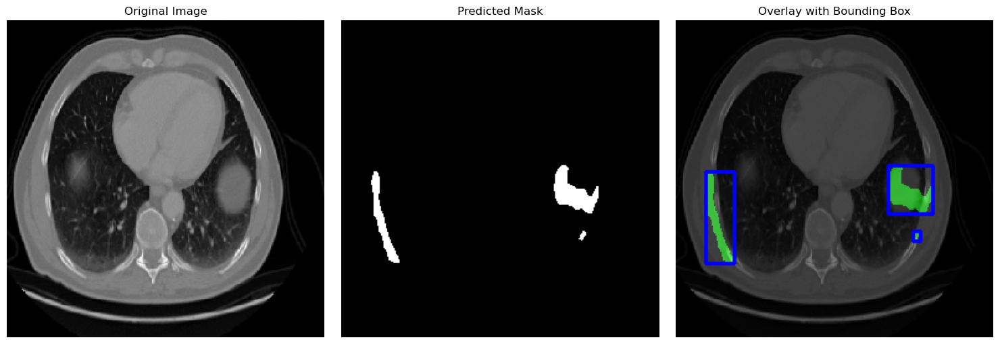

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


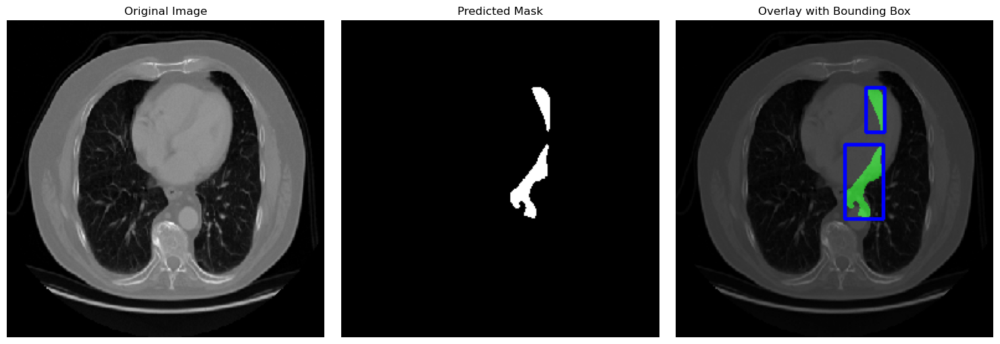

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


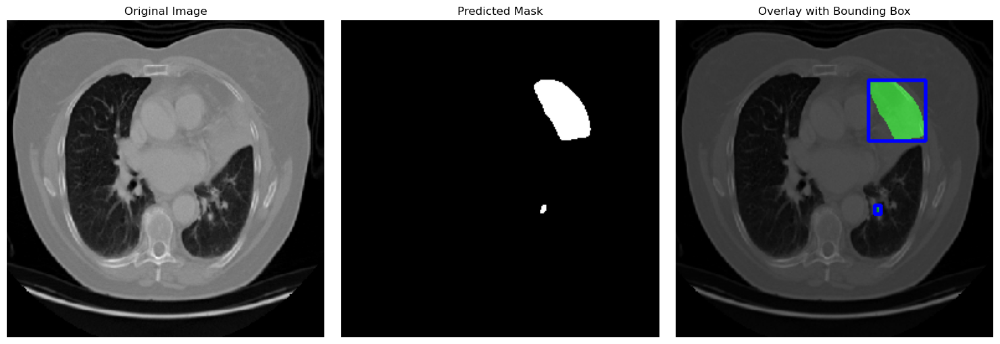

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


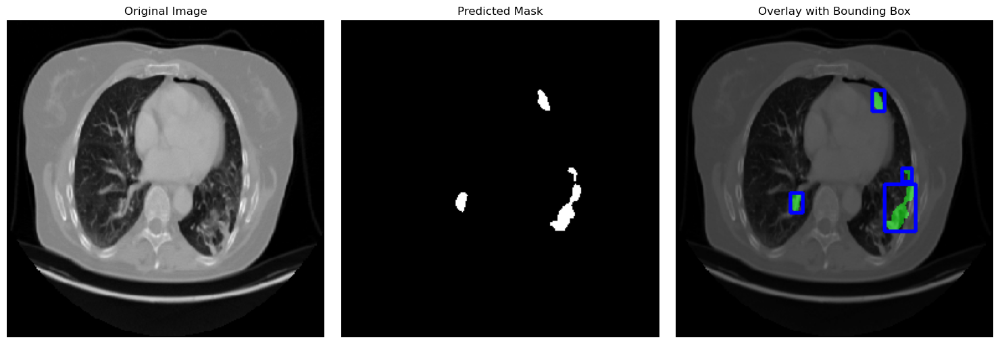

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


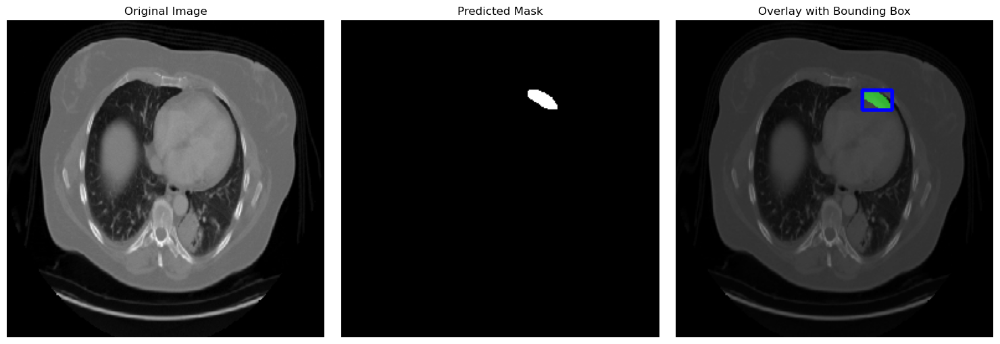

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


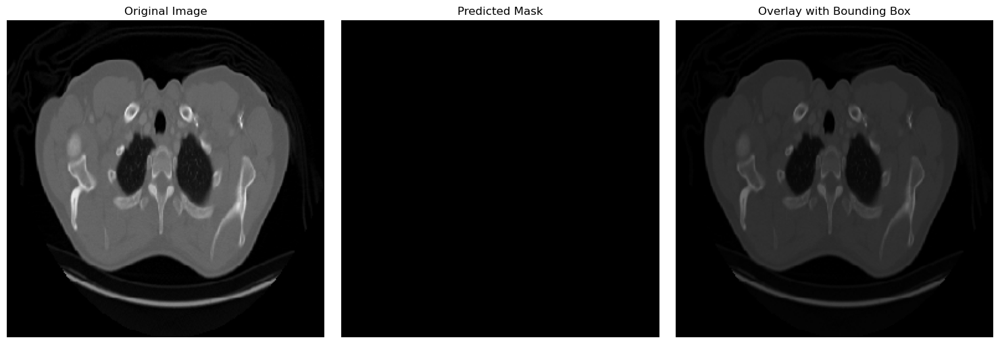

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


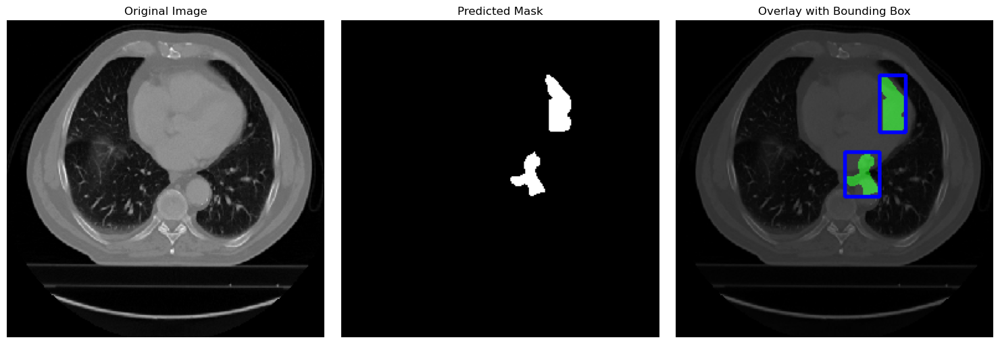

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


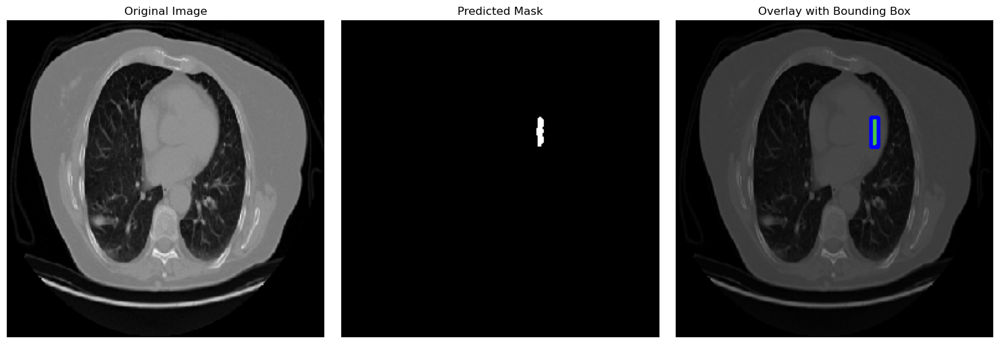

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


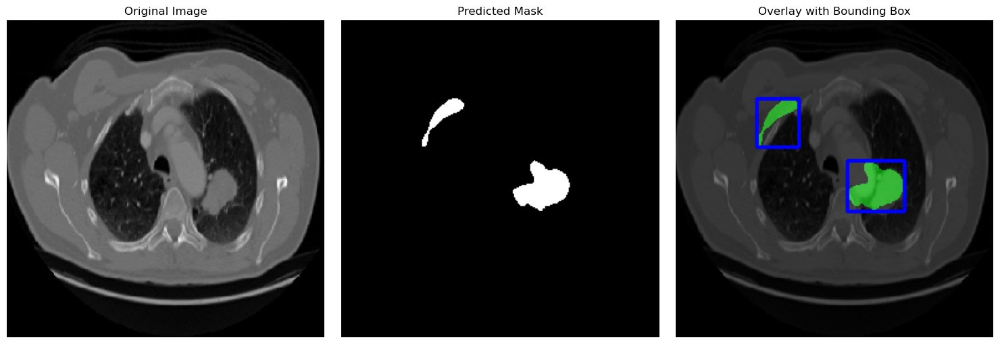

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


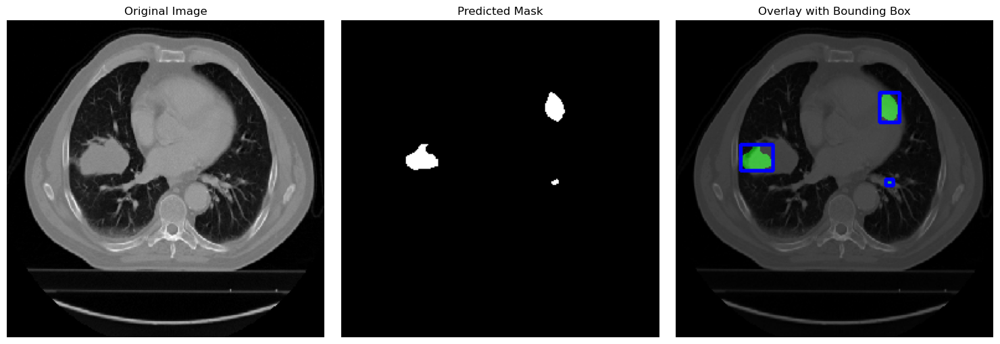

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


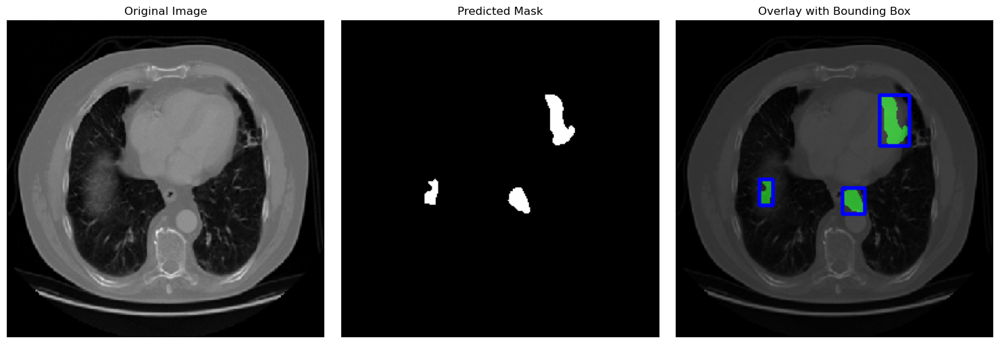

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


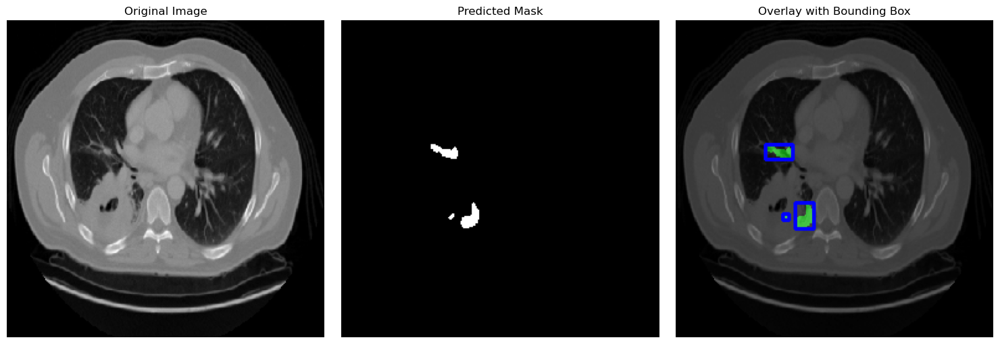

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


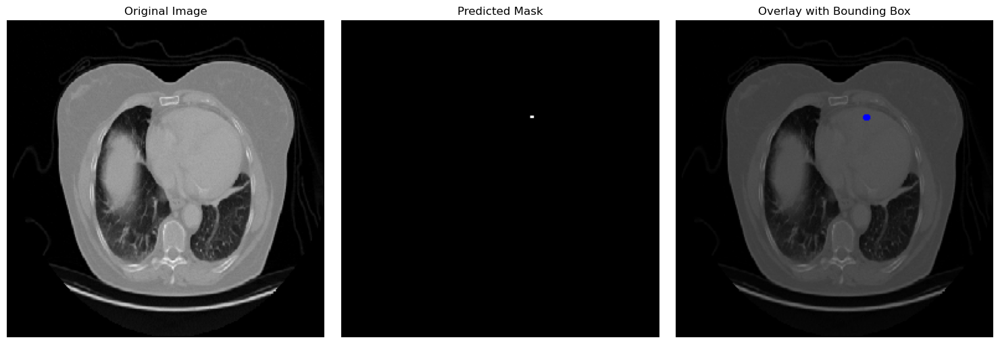

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


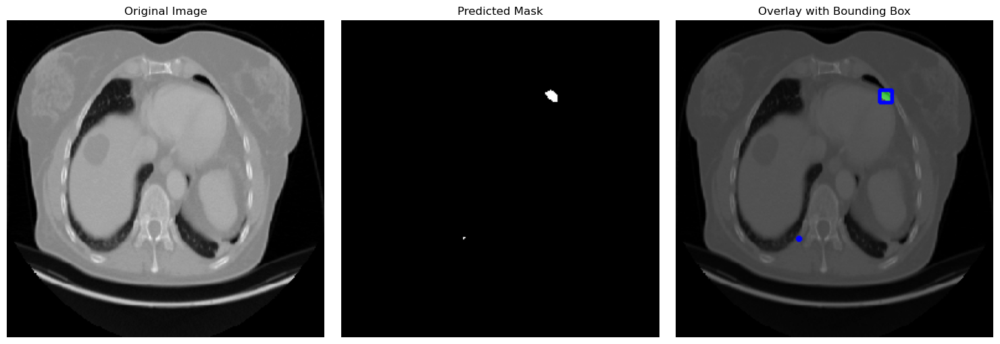

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Parameters
IMG_HEIGHT, IMG_WIDTH = 256, 256  # Ensure these match the model's input shape
THRESHOLD = 0.15  # Threshold for mask classification

# Load the trained model
model = tf.keras.models.load_model("segmentation_model_unet_final.keras")

# Preprocess the test image
def preprocess_image(image_path, img_height, img_width):
    img = load_img(image_path, target_size=(img_height, img_width), color_mode="grayscale")
    img = img_to_array(img) / 255.0  # Normalize to [0, 1]

    # Create flipped version
    flipped_img = np.fliplr(img.squeeze())

    # Apply Gaussian blur
    noise_reduced_img = cv2.GaussianBlur(img.squeeze(), (5, 5), 0)

    # Apply histogram equalization
    equalized_img = cv2.equalizeHist((img.squeeze() * 255).astype(np.uint8)) / 255.0

    # Apply Sobel edge detection
    sobel_x = cv2.Sobel(img.squeeze(), cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(img.squeeze(), cv2.CV_64F, 0, 1, ksize=3)
    sobel_combined = np.sqrt(sobel_x ** 2 + sobel_y ** 2)
    sobel_combined = (sobel_combined / sobel_combined.max()).astype(np.float32)

    # Stack all versions along the channel axis
    combined = np.stack(
        [img.squeeze(), flipped_img, noise_reduced_img, equalized_img, sobel_combined],
        axis=-1,
    )
    return combined

# Post-process the predicted mask
def postprocess_mask(mask, threshold):
    return (mask > threshold).astype(np.uint8)  # Binarize the mask

# Combine the mask with the original image
def overlay_mask_on_image(original_img, mask, color=(0, 255, 0), alpha=0.5):
    # Ensure the original image has 3 channels (grayscale to RGB)
    if len(original_img.shape) == 2:  # If single channel (grayscale)
        original_img = cv2.cvtColor(original_img, cv2.COLOR_GRAY2RGB)
    
    # Create a blank RGB mask
    mask_colored = np.zeros_like(original_img, dtype=np.uint8)
    
    # Apply the color to the regions where the mask is active
    mask_colored[mask.squeeze() > 0] = color
    
    # Blend the original image with the colored mask
    combined = cv2.addWeighted(original_img, 1 - alpha, mask_colored, alpha, 0)
    return combined

# Draw bounding box around the masked region
def draw_bounding_box(image, mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)  # Blue bounding box
    return image
    
for i in range(2, 40):
    test_image_path = f"/Users/akashvs/Documents/lung_cancer_data_copy/test/adenocarcinoma/{i}.png"
    
    # Preprocess the test image
    test_image = preprocess_image(test_image_path, IMG_HEIGHT, IMG_WIDTH)
    original_image = load_img(test_image_path, target_size=(IMG_HEIGHT, IMG_WIDTH), color_mode="grayscale")
    original_image = img_to_array(original_image).astype(np.uint8)  # Convert to uint8 for visualization
    
    # Predict the mask
    predicted_mask = model.predict(test_image[np.newaxis, ...])[0]  # Add batch dimension
    predicted_mask = postprocess_mask(predicted_mask, THRESHOLD)
    
    # Visualizations
    overlay_image = overlay_mask_on_image(original_image.squeeze(), predicted_mask, color=(0, 255, 0))
    overlay_with_bbox = draw_bounding_box(overlay_image.copy(), predicted_mask)
    
    # Display the results
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(test_image[..., 0], cmap="gray")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Predicted Mask")
    plt.imshow(predicted_mask.squeeze(), cmap="gray")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Overlay with Bounding Box")
    plt.imshow(cv2.cvtColor(overlay_with_bbox, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.tight_layout()
    plt.show()


### <a id='toc1_5_1_'></a>[Key Observations:](#toc0_)
- **High Accuracy:** The model achieves high accuracy, which is good for pixel-wise classification.
- **Low Mean IoU:** Despite high accuracy, the mean IoU is relatively low, suggesting that while the model correctly classifies most pixels, it might struggle with precisely capturing the boundaries of segmented regions.
- **Generalization:** The validation metrics (accuracy, loss, IoU) are close to the training metrics, indicating that the model generalizes well without overfitting.

## <a id='toc1_6_'></a>[Model Evaluation](#toc0_)

In [ ]:
model = tf.keras.models.load_model("segmentation_model_unet_final.keras")

from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50
from sklearn.metrics import accuracy_score, f1_score
import tensorflow as tf

# Custom CNN Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Input

import tensorflow as tf
import numpy as np
import random

# Set the random seeds
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

def build_cnn(input_shape=(256, 256, 5)):
    model = Sequential()

    # Define the input shape using Input layer
    model.add(Input(shape=input_shape)) 
    
    # Modify the input shape to match 5 channels
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))  # For binary classification (cancer/no cancer)
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    return model


# ResNet-like Model
def build_resnet(input_shape=(256, 256, 5)):
    input_layer = layers.Input(shape=input_shape)
    x = layers.Conv2D(64, (3, 3), padding='same')(input_layer)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(128, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(128, activation='relu')(x)
    output = layers.Dense(1, activation='sigmoid')(x)
    model = models.Model(inputs=input_layer, outputs=output)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])
    return model

import tensorflow as tf
from tensorflow.keras import layers, models

def build_vit(input_shape=(256, 256, 5), num_patches=16, projection_dim=64, transformer_layers=4):
    inputs = layers.Input(shape=input_shape)
    
    # Patch embedding: Convert image patches into feature embeddings
    x = layers.Conv2D(filters=projection_dim, kernel_size=(num_patches, num_patches), strides=(num_patches, num_patches), padding="valid")(inputs)
    x = layers.Reshape((x.shape[1] * x.shape[2], projection_dim))(x)  # Flatten patches
    
    # Positional encoding
    positions = tf.range(start=0, limit=x.shape[1], delta=1)
    pos_encoding = layers.Embedding(input_dim=x.shape[1], output_dim=projection_dim)(positions)
    x += pos_encoding

    # Transformer blocks
    for _ in range(transformer_layers):
        attn_output = layers.MultiHeadAttention(num_heads=8, key_dim=projection_dim)(x, x)
        x = layers.Add()([x, attn_output])
        x = layers.LayerNormalization()(x)
        
        # Feed-forward network
        ff_output = layers.Dense(projection_dim * 2, activation="relu")(x)
        ff_output = layers.Dense(projection_dim)(ff_output)
        x = layers.Add()([x, ff_output])
        x = layers.LayerNormalization()(x)

    # Classification head
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dense(64, activation='relu')(x)
    output = layers.Dense(1, activation='sigmoid')(x)

    model = models.Model(inputs=inputs, outputs=output)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    return model


# Prepare dataset: Extract the predicted mask (target) and the original image
def prepare_data():
    X = []
    y = []
    
    for i in range(1, 60):
        test_image_path = f"/Users/akashvs/Documents/lung_cancer_data_copy/test/adenocarcinoma/{i}.png"
    
        # Preprocess the test image
        test_image = preprocess_image(test_image_path, IMG_HEIGHT, IMG_WIDTH)
        
        # Predict the mask
        predicted_mask = model.predict(test_image[np.newaxis, ...])[0]  # Add batch dimension
        predicted_mask = postprocess_mask(predicted_mask, THRESHOLD)
        
        # If mask is found (non-zero), then cancer is detected (label 1), otherwise 0
        label = 1 if np.sum(predicted_mask) > 0 else 0
        X.append(test_image.squeeze())
        y.append(label)
        
    return np.array(X), np.array(y)

# Prepare data
X_data, y_data = prepare_data()

# Train/Test split (80-20 split)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.2, random_state=42)

# Reshape data for CNN models
X_train_new = X_train[..., np.newaxis]
X_test_new = X_test[..., np.newaxis]

# Build and train the models
cnn_model = build_cnn(input_shape=(256, 256, 5))
resnet_model = build_resnet(input_shape=(256, 256, 5))
vit_model = build_vit(input_shape=(256, 256, 5))

# Train the models
print('Training CNN model :')
cnn_model.fit(X_train_new, y_train, epochs=30, batch_size=15, validation_data=(X_test_new, y_test))
print('Training ResNet model :')
resnet_model.fit(X_train_new, y_train, epochs=30, batch_size=15, validation_data=(X_test_new, y_test))
print('Training ViT model :')
vit_model.fit(X_train_new, y_train, epochs=30, batch_size=15, validation_data=(X_test_new, y_test))

# Evaluate the models
cnn_pred = cnn_model.predict(X_test_new)
resnet_pred = resnet_model.predict(X_test_new)
vit_pred = vit_model.predict(X_test_new)

cnn_pred_class = (cnn_pred > 0.5).astype(int)
resnet_pred_class = (resnet_pred > 0.5).astype(int)
vit_pred_class = (vit_pred > 0.5).astype(int)

# Calculate F1-score and accuracy
cnn_acc = accuracy_score(y_test, cnn_pred_class)
cnn_f1 = f1_score(y_test, cnn_pred_class)

resnet_acc = accuracy_score(y_test, resnet_pred_class)
resnet_f1 = f1_score(y_test, resnet_pred_class)

vit_acc = accuracy_score(y_test, vit_pred_class)
vit_f1 = f1_score(y_test, vit_pred_class)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
# Create a table to compare the models
import pandas as pd

results = pd.DataFrame({
    'Model': ['CNN', 'ResNet', 'ViT'],
    'Accuracy': [cnn_acc, resnet_acc, vit_acc],
    'F1 Score': [cnn_f1, resnet_f1, vit_f1]
})
print(results)

    Model  Accuracy  F1 Score
0     CNN  0.916667  0.956522
1  ResNet  0.083333  0.000000
2     ViT  0.833333  0.909091


## <a id='toc1_7_'></a>[Conclusion](#toc0_)
- UNet-generated segmentation masks contain useful information, as CNN and ViT achieved high accuracy.
- CNN performed best, confirming that the segmentation masks are effective in aiding classification.
- ResNet’s failure suggests that certain architectures may struggle with binary mask-based classification, but this does not undermine UNet’s overall reliability.
---
Overall, the results indicate that UNet is performing well since its outputs enable successful classification, reinforcing its effectiveness for lung cancer segmentation.